In [1]:
# Import necessary packages and libraries
%matplotlib notebook
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import numpy as np
import sys
from fastai.vision.all import *

# Append paths to access certain .py files
sys.path.append("../PycastWorld")
sys.path.append("../Gym")
sys.path.append("../Notebooks")

# Import functions and classes from .py files
from gym_pycastworld.PycastWorldEnv import PycastWorldEnv
from cmd_classes_funcs_Marchese import *
from RNN_classes_funcs_Marchese import *

/home/CAMPUS/cemb2020/anaconda3/envs/arcslab/lib/python3.8/site-packages/fastbook/__init__.py:18: UserWarning: Missing `graphviz` - please run `conda install fastbook`
  except ModuleNotFoundError: warn("Missing `graphviz` - please run `conda install fastbook`")


In [2]:
# load in trained network
net = ConvRNN()
model_name = 'torch_RNN.pth'
net.load_state_dict(torch.load(model_name))
net.eval()

ConvRNN(
  (convlstm): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(18, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
      (1): ConvLSTMCell(
        (conv): Conv2d(30, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
      (2): ConvLSTMCell(
        (conv): Conv2d(30, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
      (3): ConvLSTMCell(
        (conv): Conv2d(30, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
      (4): ConvLSTMCell(
        (conv): Conv2d(30, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
      (5): ConvLSTMCell(
        (conv): Conv2d(30, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
  )
  (flat): Flatten(start_dim=1, end_dim=-1)
  (lin1): Linear(in_features=1152000, out_features=512, bias=True)
  (relu): ReLU()
  (lin2): Linear(in_features=512, out_features=3, bias=True)
)

In [3]:
# Number of steps the model should walk before it stops or reaches the end of the maze
steps_per_episode = 2000

In [4]:
# Load in the world environment
env = PycastWorldEnv("../Mazes/maze_test00.txt", 320, 240)

In [5]:
# Grab the initial observation 
observation = env.reset()
frames = [observation.copy()]

In [6]:
# Variable to keep track of the previous move
prev_move = 1

# Variable to keep track of current move's name
action_name = 'straight'

straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
left 0
left 0
left 0
left 0
straight 1
straight 1
straight 1
straight 1
left 0
left 0
left 0
left 0
left 0
left 0
left 0
left 0
left 0
left 0
left 0
left 0
left 0
left 0
left 0
left 0
left 0
left 0
left 0
left 0
left 0
left 0
left 0
straight 1
left 0
left 0
straight 1
straight 1
left 0
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
right 2
right 2
right 2
right 2
right 2
straight 1
right 2
right 2
right 2
right 2
rig

right 2
right 2
straight 1
right 2
right 2
right 2
right 2
right 2
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
right 2
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
straight 1
stra

<IPython.core.display.Javascript object>


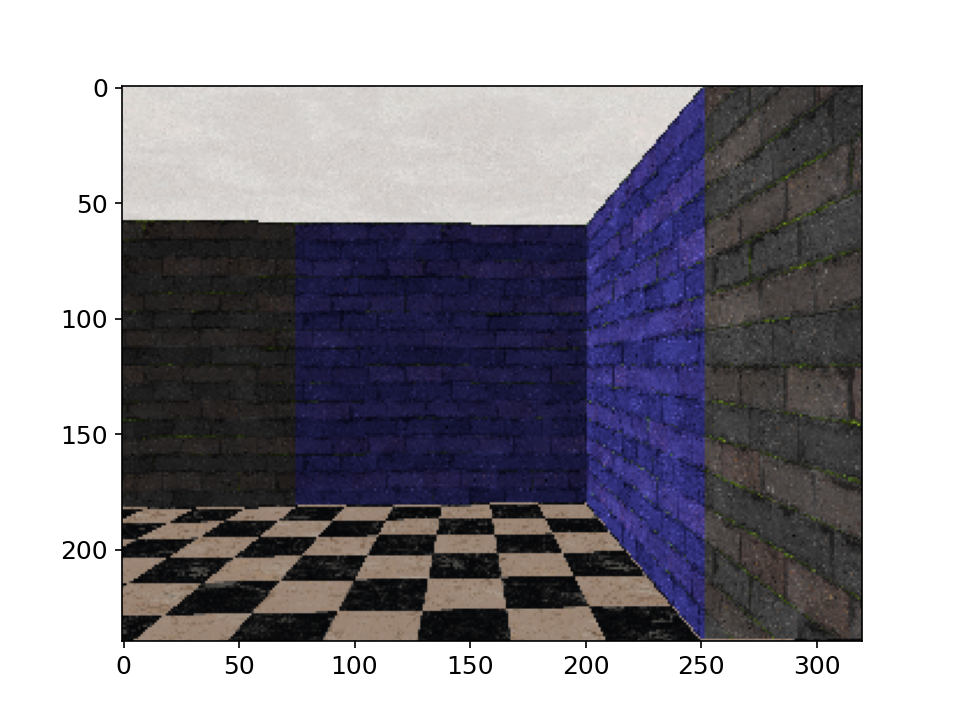

AttributeError: 'pycaster.PycastWorld' object has no attribute 'get_x'

In [7]:
# Loop to have the model walk through the maze
for t in range(steps_per_episode):
    
    # Checks what kind of model the network is in order to give the appropriate inputs
    if "cmd" in model_name:
        inp = (tensor(observation/255).permute(2,0,1).unsqueeze(0), tensor(prev_move).unsqueeze(0)) 
    elif "RNN" in model_name:
        inp = tensor(observation/255).permute(2,0,1).unsqueeze(0).unsqueeze(0)
    else:
        inp = tensor(observation/255).permute(2,0,1)
    
    # Use a trained neural network to select the action
    output = net(inp)
    
    # Getting the most probable move
    action_index = int(torch.argmax(output[0]))
                
    # Looking at what move has that probability
    if action_index == 0:
        action_name = 'left'
    elif action_index == 1:
        # Must account for differing move indexing
        # Model sees 'right' as index 1 and 'straight' as index 2;
        # this needs to be flipped
        action_index = 2
        action_name = 'right'
    else:
        action_index = 1
        action_name = 'straight'
        
    # Update previous move
    prev_move = action_index
    
    print(action_name + " " + str(action_index))

    # Advance the world one step. We could also have the step
    # method advance more than step so that it takes fewer
    # steps in total to get to the end goal.
    observation, reward, done, info = env.step(action_index)
    
    # Collect frames one by one
    frames.append(observation.copy())
    
    # Check if we reached the end goal
    if done:
        print(f"  Found goal in {t+1} steps")
        break

# Show final image
plt.imshow(observation)

# Print ending position
print(f"  Ended at position {env.world.get_x()}, {env.world.get_y()}")

# Close environment
env.close()

<IPython.core.display.Javascript object>


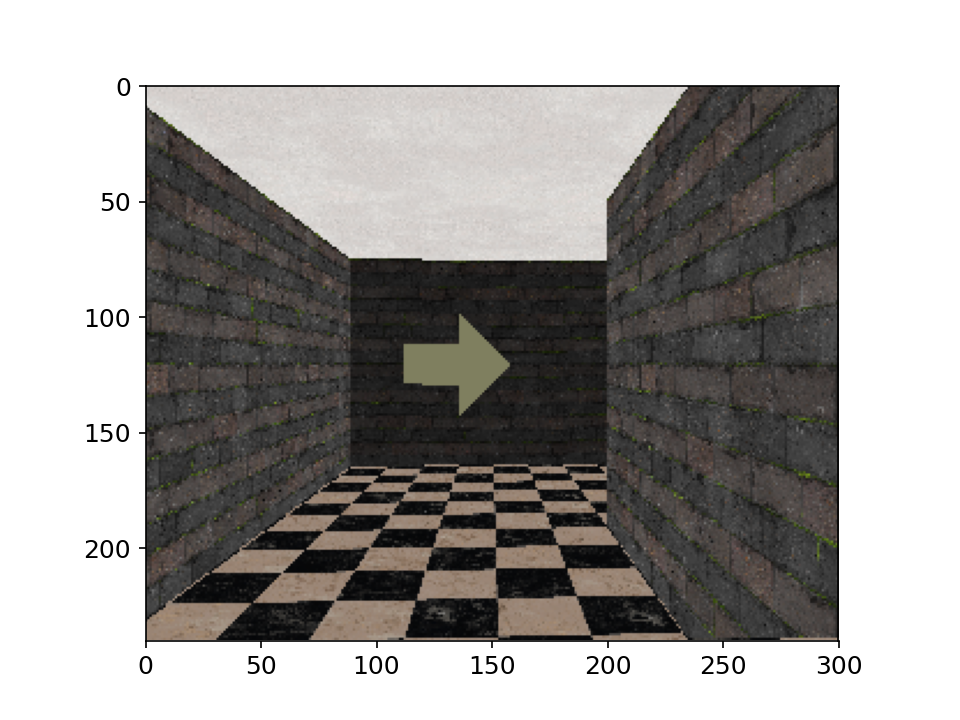

In [8]:
# Initialize subplots
fig, ax = plt.subplots()

# Set axis of animation
ax.set(xlim=(0,300), ylim=(240,0))

# Initialize frame
frame = plt.imshow(frames[0])

def init():
    """
    Creates initial frame for animation.
    
    :return: (list) a list of the initial frame for animation
    """
    frame.set_data(frames[0])
    return [frame]

def animate(i):
    """
    Updates the state of the frame at each point of the animation.
    
    :param i: (ndarray) current image/frame
    :return: (list) a list of the current frame for animation
    """
    # Define the updated content of frame
    frame.set_array(i)
    return [frame]

from IPython.display import HTML

# Take images, functions, and other parameters and create an animation
ani = FuncAnimation(fig, animate, frames[::20], init_func = init, interval = 200)
HTML(ani.to_jshtml())

In [ ]:
# Save animation
ani.save("animation" + ".gif")